In [1]:
# proposal_experiment_refactored.py
import os
import json
import logging
import numpy as np
import pandas as pd
from concurrent.futures import ProcessPoolExecutor, as_completed
from itertools import combinations
from typing import List

import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.initializers import HeNormal, GlorotUniform
from tensorflow.keras.optimizers import Adam

# -------------------------------------------------------------------
# Import common modules from the project
# -------------------------------------------------------------------
from src.data.data_loading import DataSource
from src.data.data_preparation import apply_kalman_filter
from src.common.batch_preprocessing import (load_and_preprocess_data,
                                            prepare_data,
                                            prepare_inputs,
                                            prepare_datasets, 
                                            scale_and_reshape_data,
                                            prepare_normal_inputs, 
                                            prepare_branch_inputs)

from src.evaluation.evaluation import evaluate_model, display_metrics, compute_metrics_to_df
from src.training.train_models import train_single_model
from src.common.config_wells import DATA_SOURCES
from src.utils.utilities import clean_checkpoint_files, generate_jobs

# -------------------------------------------------------------------
# Set working directory to project root
# -------------------------------------------------------------------
os.chdir(os.path.abspath(os.path.join(os.getcwd(), "..", "..")))
print(f"Working directory set to: {os.getcwd()}")

Working directory set to: /home/gabriel/Documentos/Equinor



[Proposal Experiment #1] Data source: VOLVE, Well: 15/9-F-14
Proposal Type: CVAE
Experiment Parameters: {'architecture_name': 'Proposal Network', 'feature_kind': 'Normal', 'selected_features': ['PI', 'BORE_GAS_VOL', 'BORE_OIL_VOL'], 'ensemble_models': 5, 'use_known_good': False, 'latent_dim': 16, 'beta_values': [0.5, 1.0, 1.5, 2.0], 'lag_window': 7, 'horizon': 30, 'epochs': 300, 'batch_size': 64, 'patience': 100, 'test_size': 0.6}
self.add_physical_features False
NaNs and infinite values before imputation
Col: delta_P NaN: 6
Col: delta_P InF: 0
Col: PI NaN: 6
Col: PI InF: 0
Col: AVG_DOWNHOLE_PRESSURE NaN: 6
Col: AVG_DOWNHOLE_PRESSURE InF: 0
Col: Taxa_Declinio NaN: 1
Col: Taxa_Declinio InF: 0
NaNs and infinite values after imputation
Col: delta_P NaN: 0
Col: delta_P InF: 0
Col: PI NaN: 0
Col: PI InF: 0
Col: AVG_DOWNHOLE_PRESSURE NaN: 0
Col: AVG_DOWNHOLE_PRESSURE InF: 0
Col: Taxa_Declinio NaN: 0
Col: Taxa_Declinio InF: 0
df_train.shape, df_test.shape (1075, 11) (1612, 11)


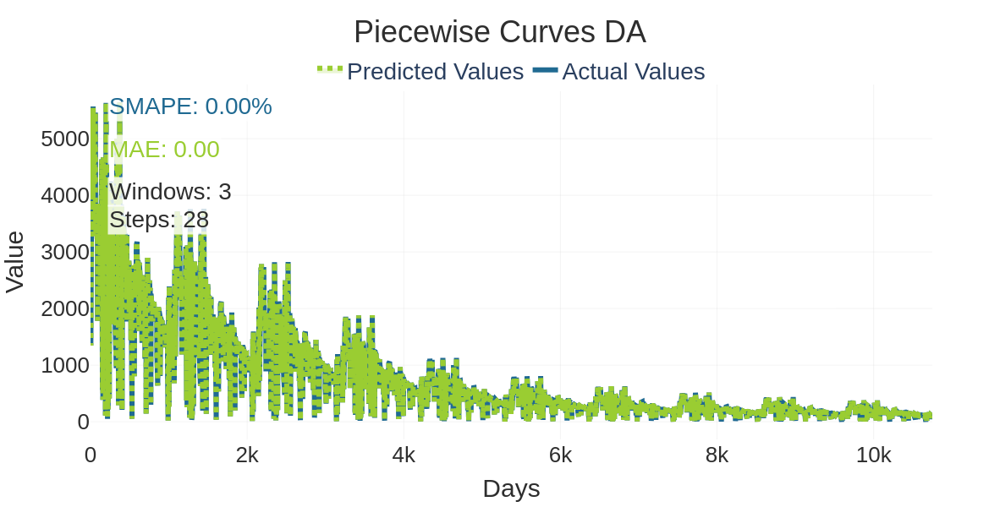

ERROR:root:Proposal Experiment #1 failed for data source: VOLVE, well: 15/9-F-14
Traceback (most recent call last):
  File "<ipython-input-2-8b206579bd53>", line 201, in run
    X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled, scaler_y = prepare_data(
ValueError: too many values to unpack (expected 5)



Proposal Experiments completed.


In [2]:
# =============================================================================
# CVAE Model Functions (Proposal Network)
# =============================================================================

def build_cvae_model(input_shape, latent_dim=8, hidden_units=[64, 32], n_outputs=1, beta=1.0):
    """
    Builds a CVAE model with an adjustable KL divergence weight (beta).
    """
    # Encoder
    inputs = layers.Input(shape=input_shape, name="cvae_input")
    x = layers.Flatten()(inputs)
    for units in hidden_units:
        x = layers.Dense(units, activation='relu', kernel_initializer='he_normal')(x)
    z_mean = layers.Dense(latent_dim, name="z_mean")(x)
    z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
    
    def sampling(args):
        z_mean, z_log_var = args
        epsilon = tf.random.normal(shape=tf.shape(z_mean))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

    z = layers.Lambda(sampling, name="z")([z_mean, z_log_var])
    encoder = Model(inputs, [z_mean, z_log_var, z], name="encoder")
    
    # Decoder: condition on both latent z and the original input.
    latent_inputs = layers.Input(shape=(latent_dim,), name="z_sampling")
    cond_inputs = layers.Input(shape=input_shape, name="cvae_cond")
    cond_flat = layers.Flatten()(cond_inputs)
    dec_input = layers.Concatenate()([latent_inputs, cond_flat])
    x_dec = dec_input
    for units in hidden_units:
        x_dec = layers.Dense(units, activation='relu', kernel_initializer='he_normal')(x_dec)
    outputs = layers.Dense(n_outputs, name="candidate_output")(x_dec)
    decoder = Model([latent_inputs, cond_inputs], outputs, name="decoder")
    
    # CVAE Model: maps input to candidate output.
    candidate = decoder([z, inputs])
    cvae = Model(inputs, candidate, name="CVAE_Model")
    
    # Add weighted KL divergence loss.
    kl_loss = beta * (-0.5 * tf.reduce_mean(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)))
    cvae.add_loss(kl_loss)
    
    # Compile with Mean Squared Error reconstruction loss.
    cvae.compile(optimizer='adam', loss=tf.keras.losses.MeanSquaredError())
    return encoder, decoder, cvae


def train_cvae_model(train_kwargs, prediction_input, epochs=100, batch_size=64, patience=20,
                     latent_dim=8, n_outputs=1, beta=1.0):
    """
    Trains the CVAE proposal network with an adjustable beta value.
    
    Returns:
      - encoder, decoder, cvae, history
    """
    X_train, y_train = train_kwargs["X_train"], train_kwargs["y_train"]
    input_shape = X_train.shape[1:]
    
    encoder, decoder, cvae = build_cvae_model(input_shape, latent_dim=latent_dim, n_outputs=n_outputs, beta=beta)
    callbacks = [tf.keras.callbacks.EarlyStopping(monitor='loss', patience=patience, restore_best_weights=True)]
    history = cvae.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, callbacks=callbacks, verbose=0)
    return encoder, decoder, cvae, history


def train_cvae_model_standard(train_kwargs, prediction_input, epochs=100, batch_size=64, patience=20,
                              latent_dim=8, n_outputs=1):
    """
    Trains a standard CVAE (beta=1.0) for backward compatibility.
    """
    return train_cvae_model(train_kwargs, prediction_input, epochs, batch_size, patience,
                            latent_dim, n_outputs, beta=1.0)

# =============================================================================
# Candidate Sampling and Ensembling Functions
# =============================================================================

def sample_candidates(encoder, decoder, x, n_samples=10, noise_scale=1.0):
    """
    Generates candidate predictions by sampling the latent space.
    
    Parameters:
      - n_samples: number of candidate predictions.
      - noise_scale: multiplier for noise injection.
      
    Returns:
      - List of candidate predictions.
    """
    candidates = []
    for i in range(n_samples):
        # Obtain latent distribution parameters.
        z_mean, z_log_var, _ = encoder.predict(x)
        epsilon = np.random.normal(size=z_mean.shape)
        z_sample = z_mean + noise_scale * np.exp(0.5 * z_log_var) * epsilon
        candidate = decoder.predict([z_sample, x])
        candidates.append(candidate)
    return candidates


def ensemble_predictions(candidates_list: List[np.ndarray]) -> np.ndarray:
    """
    Averages a list of candidate predictions.
    """
    return np.mean(np.array(candidates_list), axis=0)


def run_candidate_experiments(encoder, decoder, prediction_input, y_test_scaled, scaler_y,
                              lag_window, horizon, test_size, n_samples=10,
                              candidate_mode="standard", noise_scale=1.0, config={}):
    """
    Generates multiple candidate predictions, evaluates each, and returns an ensembled prediction.
    """
    candidate_sets = sample_candidates(encoder, decoder, prediction_input, n_samples=n_samples, noise_scale=noise_scale)
    ensemble_list = []
    for idx, candidate in enumerate(candidate_sets):
        print(f"Evaluating candidate {idx+1}/{n_samples} - Mode: {candidate_mode}")
        # Evaluate each candidate (plots and inverse scaling are performed internally).
        y_test_inv, candidate_inv = evaluate_model(
            y_test_scaled, candidate, scaler_y,
            lag_window, horizon, test_size, config,
            eval_title=f"Candidate {idx+1} - {candidate_mode}",
            set_name=f"Candidate {idx+1} - {candidate_mode}"
        )
        # Re-scale candidate_inv to accumulate for ensemble averaging.
        ensemble_list.append(scaler_y.transform(candidate_inv.reshape(-1, 1)))
    ensemble_prediction = ensemble_predictions(ensemble_list)
    # Evaluate the ensembled prediction.
    y_test_inv, ensemble_inv = evaluate_model(
        y_test_scaled, ensemble_prediction, scaler_y,
        lag_window, horizon, test_size, config,
        eval_title=f"Ensemble - {candidate_mode}",
        set_name=f"Ensemble - {candidate_mode}"
    )
    return ensemble_prediction

# =============================================================================
# ExperimentProposal Class for CVAE Proposal Networks
# =============================================================================

class ExperimentProposal:
    """
    Encapsulates a CVAE proposal network experiment run, including candidate generation
    via standard sampling, noise injection, and beta-VAE variations.
    """
    def __init__(self, config, well, params, exp_id, proposal_type="CVAE"):
        self.config = config
        self.well = well
        self.params = params
        self.exp_id = exp_id
        self.proposal_type = proposal_type

    def get_features(self):
        # Determine the main feature and selected features.
        main_feature = self.config.get("target_column", self.config["load_params"].get("serie_name"))
        selected_features = self.params.get("selected_features", self.config.get("features", [main_feature]))
        if self.params.get("use_known_good", False):
            selected_features = ['BORE_GAS_VOL', 'CE', 'PI', 'BORE_OIL_VOL_Original', main_feature]
        return main_feature, selected_features

    def get_params(self):
        # Extract experiment parameters with defaults.
        return {
            "lag_window": self.params.get("lag_window", 7),
            "horizon": self.params.get("horizon", 30),
            "epochs": self.params.get("epochs", 300),
            "batch_size": self.params.get("batch_size", 64),
            "patience": self.params.get("patience", 100),
            "test_size": self.params.get("test_size", 0.6),
            "feature_kind": self.params.get("feature_kind", 'Branch'),
            "architecture_name": self.params.get("architecture_name", 'Proposal'),
            "latent_dim": self.params.get("latent_dim", 16),
            "beta_values": self.params.get("beta_values", [0.5, 1.0, 1.5, 2.0])
        }

    def print_header(self):
        header = f"\n[Proposal Experiment #{self.exp_id}] Data source: {self.config['name']}, Well: {self.well}"
        print(header)
        print(f"Proposal Type: {self.proposal_type}")
        print(f"Experiment Parameters: {self.params}")

    def run(self):
        try:
            # 1. Get features and parameters.
            main_feature, selected_features = self.get_features()
            params = self.get_params()
            lag_window = params["lag_window"]
            horizon = params["horizon"]
            epochs = params["epochs"]
            batch_size = params["batch_size"]
            patience = params["patience"]
            test_size = params["test_size"]
            feature_kind = params["feature_kind"]
            architecture_name = params["architecture_name"]
            latent_dim = params["latent_dim"]
            beta_values = params["beta_values"]

            self.print_header()

            # 2. Load and preprocess data.
            df_subset = load_and_preprocess_data(DataSource, self.config, selected_features, self.well)
            X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled, scaler_y = prepare_data(
                df_subset, main_feature, lag_window, horizon, test_size, data_aug=True
            )
            train_kwargs, prediction_input = prepare_inputs(
                X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled,
                feature_kind, selected_features, main_feature
            )

            # 3. Train standard CVAE (beta = 1.0).
            encoder, decoder, cvae, history = train_cvae_model_standard(
                train_kwargs, prediction_input, epochs, batch_size, patience,
                latent_dim=latent_dim, n_outputs=1
            )

            # 4a. Standard Candidate Generation.
            print("\n--- Standard Candidate Generation ---")
            ensemble_standard = run_candidate_experiments(
                encoder, decoder, prediction_input, y_test_scaled, scaler_y,
                lag_window, horizon, test_size, n_samples=5,
                candidate_mode="standard", noise_scale=1.0, config=self.config
            )

            # 4b. Explicit Noise Injection Candidate Generation.
            print("\n--- Explicit Noise Injection Candidate Generation ---")
            ensemble_noise = run_candidate_experiments(
                encoder, decoder, prediction_input, y_test_scaled, scaler_y,
                lag_window, horizon, test_size, n_samples=5,
                candidate_mode="noise", noise_scale=2.0, config=self.config
            )

            # 4c. Beta-VAE Experiments for multiple beta values.
            ensemble_beta_list = []
            for beta in beta_values:
                print(f"\n--- Training Beta-VAE with beta = {beta} ---")
                encoder_beta, decoder_beta, cvae_beta, history_beta = train_cvae_model(
                    train_kwargs, prediction_input, epochs, batch_size, patience,
                    latent_dim=latent_dim, n_outputs=1, beta=beta
                )
                ensemble_beta = run_candidate_experiments(
                    encoder_beta, decoder_beta, prediction_input, y_test_scaled, scaler_y,
                    lag_window, horizon, test_size, n_samples=5,
                    candidate_mode=f"beta_{beta}", noise_scale=1.0, config=self.config
                )
                ensemble_beta_list.append(ensemble_beta)
            ensemble_beta_final = ensemble_predictions(ensemble_beta_list)
            # Evaluate the final beta ensemble.
            y_test_inv, ensemble_beta_inv = evaluate_model(
                y_test_scaled, ensemble_beta_final, scaler_y,
                lag_window, horizon, test_size, self.config,
                eval_title="Ensemble Beta-VAE", set_name="Ensemble Beta-VAE"
            )

            print(f"\n[Proposal Experiment #{self.exp_id}] Completed for Data source: {self.config['name']}, Well: {self.well}\n")
            return {
                "data_source": self.config["name"],
                "well": self.well,
                "experiment": self.params,
                "experiment_id": self.exp_id,
                "ensemble_standard": ensemble_standard.tolist(),
                "ensemble_noise": ensemble_noise.tolist(),
                "ensemble_beta": ensemble_beta_final.tolist(),
                "y_test_scaled": y_test_scaled.tolist(),
                "scaler_y": scaler_y,
                "lag_window": lag_window,
                "horizon": horizon,
                "test_size": test_size,
                "main_feature": main_feature,
                "proposal_type": self.proposal_type,
                "status": "success"
            }
        except Exception as e:
            logging.exception(f"Proposal Experiment #{self.exp_id} failed for data source: {self.config['name']}, well: {self.well}")
            return {
                "data_source": self.config["name"],
                "well": self.well,
                "experiment": self.params,
                "experiment_id": self.exp_id,
                "error": str(e),
                "status": "failure"
            }

# =============================================================================
# Main Pipeline for Proposal Network Experiments
# =============================================================================

def main_proposal(ensemble_models=1, selected_names=None, proposal_type="CVAE"):
    """
    Main pipeline to load, preprocess, train, and evaluate CVAE proposal network models,
    including candidate ensemble experiments (standard, noise injection, and beta-VAE).
    """
    clean_checkpoint_files("model_checkpoint")
    logging.basicConfig(level=logging.INFO, format="%(asctime)s - %(levelname)s - %(message)s")
    
    if selected_names is None:
        selected_names = [ds["name"] for ds in DATA_SOURCES]
    filtered_data_sources = [ds for ds in DATA_SOURCES if ds["name"] in selected_names]
    
    # Define proposal experiment configurations.
    proposal_experiments = [
        {
            "architecture_name": "Proposal Network",
            "feature_kind": "Normal",
            "selected_features": ['PI', 'BORE_GAS_VOL', 'BORE_OIL_VOL'],
            "ensemble_models": ensemble_models,
            "use_known_good": False,
            # CVAE-specific parameters:
            "latent_dim": 16,
            "beta_values": [0.5, 1.0, 1.5, 2.0],
            "lag_window": 7,
            "horizon": 30,
            "epochs": 300,
            "batch_size": 64,
            "patience": 100,
            "test_size": 0.6
        },
    ]
    
    jobs = []
    experiment_counter = 1
    for ds in filtered_data_sources:
        for well in ds["wells"]:
            for exp_params in proposal_experiments:
                jobs.append((ds, well, exp_params, experiment_counter))
                experiment_counter += 1
    
    results = []
    with ProcessPoolExecutor(max_workers=min(4, len(jobs))) as executor:
        future_to_job = {
            executor.submit(ExperimentProposal(ds, well, exp_params, exp_id, proposal_type).run): (ds, well, exp_params, exp_id)
            for ds, well, exp_params, exp_id in jobs
        }
        for future in as_completed(future_to_job):
            job_info = future_to_job[future]
            try:
                results.append(future.result())
            except Exception as exc:
                logging.error(f"Job {job_info} generated an exception: {exc}")
    
    print("\nProposal Experiments completed.")
    # (Optional) Further aggregation or visualization of overall results can be done here.

if __name__ == "__main__":
    # Example: Run proposal experiments for the VOLVE data source using CVAE.
    main_proposal(ensemble_models=5, selected_names=["VOLVE"], proposal_type="CVAE")


In [20]:
from xml.etree import ElementTree as ET
import re

# Função geradora de estilo com paleta de cores de Dalí
def estilizar_drawio(xml_content: str, palette: list) -> str:
    tree = ET.ElementTree(ET.fromstring(xml_content))
    root = tree.getroot()

    i = 0
    for cell in root.findall(".//mxCell"):
        style = cell.get("style")
        if style and "fillColor=" in style:
            color = palette[i % len(palette)]
            new_style = re.sub(r'fillColor=#[0-9A-Fa-f]+', f'fillColor={color}', style)
            cell.set("style", new_style)
            i += 1

    return ET.tostring(root, encoding="unicode")

# Paleta de Salvador Dalí
dali_palette = [
    "#B03A2E",  # vermelho queimado
    "#76448A",  # roxo escuro
    "#117864",  # verde musgo
    "#F1C40F",  # dourado
    "#2980B9",  # azul intenso
    "#7E5109",  # marrom terroso
    "#4A235A",  # violeta escuro
    "#1C2833"   # cinza azulado escuro
]

# Carregar conteúdo do XML de exemplo (arquivo de entrada do usuário)
with open("Teste_3.drawio", "r", encoding="utf-8") as f:
    original_xml_content = f.read()

# Gerar XML estilizado
styled_xml = estilizar_drawio(original_xml_content, dali_palette)

# Salvar resultado
output_path = "Teste_4.drawio"
with open(output_path, "w", encoding="utf-8") as f:
    f.write(styled_xml)

output_path

'Teste_4.drawio'

In [74]:
import argparse
import json
import logging
import sys
import uuid
from dataclasses import dataclass, field
from pathlib import Path
from typing import Any, Dict, List, Optional, Union

import xml.etree.ElementTree as ET
from xml.dom import minidom

# --- Constants ---
DEFAULT_NODE_WIDTH = 120
DEFAULT_NODE_HEIGHT = 60
DEFAULT_SPACING = 80
DEFAULT_LAYER_ID = "1"
DRAWIO_HOST = "app.diagrams.net"
DRAWIO_AGENT = "PythonDiagramGenerator/0.3"
DRAWIO_VERSION = "24.4.0"

# --- Data Models ---
@dataclass
class StyleDefaults:
    node: Dict[str, Any] = field(default_factory=dict)
    edge: Dict[str, Any] = field(default_factory=dict)

@dataclass
class NodeData:
    id: str
    label: str = ''
    shape: Optional[str] = None
    is_container: bool = False
    parent: Optional[str] = None
    layer: Optional[str] = None
    position: Dict[str, int] = field(default_factory=dict)
    size: Dict[str, int] = field(default_factory=dict)
    styling: Dict[str, Any] = field(default_factory=dict)

@dataclass
class EdgeData:
    id: Optional[str]
    source: str
    target: str
    label: str = ''
    layer: Optional[str] = None
    waypoints: List[Dict[str, int]] = field(default_factory=list)
    styling: Dict[str, Any] = field(default_factory=dict)

@dataclass
class DiagramData:
    metadata: Dict[str, Any]
    defaults: StyleDefaults
    layout: Dict[str, Any]
    layers: List[Dict[str, Any]]
    nodes: List[NodeData]
    edges: List[EdgeData]

# styles.py
# Contains theme definitions and registry

from dataclasses import dataclass, field
from typing import List, Optional, Dict



# styles.py
# Contains theme definitions and registry

from dataclasses import dataclass, field
from typing import List, Optional, Dict, Literal

# Define allowed line styles explicitly for clarity
EdgeLineStyle = Literal['solid', 'dashed', 'dotted']

@dataclass
class StyleTheme:
    """Represents a visual theme for styling diagrams."""
    name: str
    description: str

    # --- Colors ---
    node_fill_palette: List[str] = field(default_factory=list)
    # Can be hex color OR "none" to remove border
    node_stroke_color: Optional[str] = None
    node_font_color: Optional[str] = None
    edge_stroke_color: Optional[str] = None
    edge_font_color: Optional[str] = None

    # --- NEW: Line Styles & Widths ---
    # Applies to all edges unless overridden by edge's specific styling
    edge_line_style: Optional[EdgeLineStyle] = None
    # Applies to all edges unless overridden by edge's specific styling
    edge_stroke_width: Optional[int] = None
    # Applies to all nodes unless overridden by node's specific styling
    node_stroke_width: Optional[int] = None

    # --- NEW: Opacity ---
    # Applies to all nodes unless overridden by node's specific styling (0-100)
    node_opacity: Optional[int] = None
    # Applies to all edges unless overridden by edge's specific styling (0-100)
    edge_opacity: Optional[int] = None

    # --- Future Extension Ideas ---
    # font_family: Optional[str] = None
    # default_node_shape: Optional[str] = None # Could override shape for all nodes

    def get_node_fill_color(self, index: int) -> Optional[str]:
        """Gets a node fill color from the palette, cycling."""
        if not self.node_fill_palette:
            return None
        # Ensure index is non-negative, handle empty list case gracefully elsewhere
        return self.node_fill_palette[index % len(self.node_fill_palette)]

# --- Updated & New Predefined Themes ---

# Van Gogh - Keep as is or tweak slightly
van_gogh_theme = StyleTheme(
    name="VanGogh",
    description="Inspired by Van Gogh's Starry Night.",
    node_fill_palette=["#0b1e38", "#2f4f6f", "#f9d71c", "#ffffff", "#4682b4", "#10345b"],
    node_stroke_color="#000000",
    node_font_color="#FFFFFF",
    edge_stroke_color="#aeacac",
    edge_font_color="#333333",
    # Example: Slightly thicker edges for this style
    edge_stroke_width=2
)

# Monet - Keep as is
monet_theme = StyleTheme(
    name="Monet",
    description="Inspired by Monet's Water Lilies.",
    node_fill_palette=["#a4c8a0", "#5f949b", "#e1cec5", "#7fa4c5", "#c8a0c8", "#f0e6d2"],
    node_stroke_color="#5f949b",
    node_font_color="#333333",
    edge_stroke_color="#777777",
    edge_font_color="#333333"
)

# Dali - Keep as is
dali_theme = StyleTheme(
    name="Dali",
    description="Surrealist palette inspired by Salvador Dalí.",
    node_fill_palette=["#B03A2E", "#76448A", "#117864", "#F1C40F", "#2980B9", "#7E5109", "#4A235A", "#1C2833"],
    node_stroke_color="#1C2833",
    node_font_color="#FFFFFF",
    edge_stroke_color="#76448A",
    edge_font_color="#FFFFFF"
)

# Minimalist - Make nodes borderless
minimalist_theme = StyleTheme(
    name="Minimalist",
    description="Clean black, white, and grey theme with borderless nodes.",
    node_fill_palette=["#FFFFFF"],
    node_stroke_color="none", # <-- Remove node borders
    node_font_color="#000000",
    edge_stroke_color="#444444",
    edge_font_color="#000000"
    # edge_stroke_width=1 # Explicitly 1px edges
)

# NEW: Sketch Theme
sketch_theme = StyleTheme(
    name="Sketch",
    description="Hand-drawn sketch look with dashed lines and thicker strokes.",
    node_fill_palette=["#FFFFFF", "#F5F5F5"], # Mostly white/off-white
    node_stroke_color="#333333",
    node_font_color="#333333",
    node_stroke_width=2, # Thicker node borders
    # node_opacity=90,   # Slightly transparent nodes?
    edge_stroke_color="#555555",
    edge_font_color="#333333",
    edge_line_style="dashed", # <-- Dashed edges by default
    edge_stroke_width=2       # <-- Thicker edges
    # edge_opacity=90,
)

# NEW: Blueprint Theme
blueprint_theme = StyleTheme(
    name="Blueprint",
    description="Technical blueprint style with blue background perception.",
    # Note: Actual background isn't changed here, just node/edge colors
    node_fill_palette=["#1a2a6c"], # Dark blue fill
    node_stroke_color="#FFFFFF",   # White borders
    node_font_color="#FFFFFF",     # White text
    node_stroke_width=1,
    edge_stroke_color="#add8e6",   # Light blue edges
    edge_font_color="#FFFFFF",     # White text
    edge_line_style='solid',
    edge_stroke_width=1
)

# NEW: Ghost Theme
ghost_theme = StyleTheme(
    name="Ghost",
    description="Ethereal look with high transparency.",
    node_fill_palette=["#e0f7fa", "#e8f5e9"], # Very pale blues/greens
    node_stroke_color="#b0bec5",           # Light grey border
    node_font_color="#455a64",             # Darker text for readability
    node_opacity=60,                       # <-- Node transparency
    edge_stroke_color="#cfd8dc",           # Very light grey edges
    edge_font_color="#607d8b",
    edge_opacity=70,                       # <-- Edge transparency
    edge_stroke_width=1
)


# --- Registry of Themes ---
PREDEFINED_THEMES: Dict[str, StyleTheme] = {
    theme.name.lower(): theme for theme in [
        van_gogh_theme,
        monet_theme,
        dali_theme,
        minimalist_theme,
        sketch_theme,
        blueprint_theme,
        ghost_theme,
        # Add more themes here
    ]
}

def get_theme(name: Optional[str]) -> Optional[StyleTheme]:
    """Gets a theme by name (case-insensitive). Returns None if not found."""
    if not name:
        return None
    return PREDEFINED_THEMES.get(name.lower())


class StyleMapper:
    # --- Keep map_shape, map_line, map_routing, map_arrow methods ---
    @staticmethod
    def map_shape(name: Optional[str], props: Dict[str, Any]) -> Dict[str, str]:
        # ... (implementation as before) ...
        base = {'shape': 'rectangle', 'whiteSpace': 'wrap', 'rounded': '0'}
        mapping = {
            'ellipse': ('ellipse', 'ellipsePerimeter'),
            'diamond': ('rhombus', 'rhombusPerimeter'),
            'rhombus': ('rhombus', 'rhombusPerimeter'),
            'cylinder': ('cylinder3', None),
            'database': ('cylinder3', None),
            'note': ('note', None),
            'actor': ('actor', None),
            'cloud': ('cloud', None),
            'hexagon': ('hexagon', 'hexagonPerimeter2'),
            'rounded_rectangle': ('rectangle', None),
        }
        key = (name or '').lower()
        shape_val, perimeter = mapping.get(key, (base['shape'], None))
        style = {'shape': shape_val, 'whiteSpace': 'wrap'}
        if perimeter:
            style['perimeter'] = perimeter
        # rounded override
        if key == 'rounded_rectangle' or props.get('rounded') is True:
            style['rounded'] = '1'
        elif props.get('rounded') is False:
            style['rounded'] = '0'
        else:
            style.setdefault('rounded','0') # Ensure rounded is set

        # special shapes
        if key in ('cylinder', 'database'):
            style.update({'boundedLbl': '1', 'size': '15'})
        if key == 'note':
            style.update({'size': '15', 'verticalAlign': 'top', 'align': 'left'})
        return style

    @staticmethod
    def map_line(style: Optional[str]) -> Dict[str, str]:
        s = (style or 'solid').lower()
        if s == 'dashed': return {'dashed': '1', 'dashPattern':None} # Reset pattern for simple dashed
        if s == 'dotted': return {'dashed': '1', 'dashPattern': '1 4'}
        # If solid, ensure dashed/dashPattern are removed if previously set
        return {'dashed':None, 'dashPattern':None}

    @staticmethod
    def map_routing(r: Optional[str]) -> Dict[str, str]:
        v = (r or 'orthogonal').lower()
        if v == 'straight': return {'edgeStyle': 'straightEdgeStyle', 'rounded': '0'}
        if v == 'curved':
            return {'edgeStyle': 'elbowEdgeStyle', 'elbow': 'vertical', 'rounded': '1'}
        return {'edgeStyle': 'orthogonalEdgeStyle', 'rounded': '0'}

    @staticmethod
    def map_arrow(a: Optional[str]) -> str:
        return {'classic':'classic','block':'block','open':'open','diamond':'diamond','oval':'oval'}.get((a or '').lower(), 'none')


    @classmethod
    def build_style(cls,
                    item: Union[NodeData, EdgeData],
                    defaults: StyleDefaults,
                    is_edge: bool=False,
                    theme: Optional[StyleTheme] = None, # Accepts theme
                    element_index: int = 0             # Index for palettes
                    ) -> str:
        # 1. Combine base defaults and element specific styling
        base = defaults.edge if is_edge else defaults.node
        props = {**base, **item.styling} # Element styles override defaults

        # 2. Initialize style dictionary
        style: Dict[str, Any] = {'html': '1'}

        # 3. Apply base mapping and styles derived from combined props
        if is_edge:
            style.update(cls.map_routing(props.get('routing_style')))
            style.update(cls.map_line(props.get('line_style'))) # Apply initial line style
            style['startArrow'] = cls.map_arrow(props.get('source_arrow'))
            style['endArrow'] = cls.map_arrow(props.get('target_arrow') or 'classic')
            style['strokeColor'] = props.get('strokeColor', props.get('stroke_color', '#666666'))
            if fc := props.get('fontColor'): style['fontColor'] = fc
            if sw := props.get('strokeWidth'): style['strokeWidth'] = str(sw) # Apply initial width
            if op := props.get('opacity'): style['opacity'] = str(op)       # Apply initial opacity

        else: # Node
            style.update(cls.map_shape(props.get('shape'), props))
            if item.is_container:
                style.update({'container':'1','group':'1'})
                style.setdefault('fillColor','none')
                style.setdefault('strokeColor','#000000')
                style.setdefault('dashed','1')
            else: # Regular node - apply fill only if not container
                 if fill := props.get('fillColor', props.get('fill_color')):
                     style['fillColor'] = fill

            # Apply stroke color/width, align, font from props/defaults
            if stroke := props.get('strokeColor', props.get('stroke_color')):
                 style['strokeColor'] = stroke
            if sw := props.get('strokeWidth'): style['strokeWidth'] = str(sw) # Apply initial width
            if op := props.get('opacity'): style['opacity'] = str(op)       # Apply initial opacity
            style['align'] = props.get('align','center')
            style['verticalAlign'] = props.get('verticalAlign','middle')
            if fc := props.get('fontColor'): style['fontColor'] = fc

        # Apply common overrides (like rotation, fontSize) from props
        for key in ('rotation','fontSize'): # Others handled above
            if key in props:
                v = props[key]
                if v is not None: style[key] = str(v)
                else: style.pop(key, None) # Remove if explicitly None

        # --- 4. Apply Theme Overrides (Highest Priority) ---
        if theme:
            if is_edge:
                # Edge colors
                if theme.edge_stroke_color: style['strokeColor'] = theme.edge_stroke_color
                if theme.edge_font_color: style['fontColor'] = theme.edge_font_color
                # Edge line style & width
                if theme.edge_line_style:
                    style.update(cls.map_line(theme.edge_line_style)) # Override previous line style
                if theme.edge_stroke_width is not None: # Check for None, 0 is valid
                    style['strokeWidth'] = str(theme.edge_stroke_width)
                # Edge opacity
                if theme.edge_opacity is not None:
                    style['opacity'] = str(theme.edge_opacity)

            else: # Node
                # Node fill color (only for non-containers)
                if not item.is_container:
                     fill_color = theme.get_node_fill_color(element_index)
                     if fill_color: style['fillColor'] = fill_color
                # Node stroke color (handles "none") & width
                if theme.node_stroke_color is not None:
                     style['strokeColor'] = theme.node_stroke_color
                if theme.node_stroke_width is not None:
                     style['strokeWidth'] = str(theme.node_stroke_width)
                 # Special case: if border is none, strokeWidth doesn't matter
                if style.get('strokeColor') == 'none':
                     style.pop('strokeWidth', None) # Remove strokeWidth if border is none

                # Node font color
                if theme.node_font_color: style['fontColor'] = theme.node_font_color
                # Node opacity
                if theme.node_opacity is not None:
                    style['opacity'] = str(theme.node_opacity)

        # --- 5. Assemble final string ---
        # Filter out None values resulting from map_line clearing dashed etc.
        fs = {k:v for k,v in style.items() if v is not None}
        parts = []
        if 'shape' in fs: parts.append(f"shape={fs.pop('shape')}")
        if 'edgeStyle' in fs: parts.append(f"edgeStyle={fs.pop('edgeStyle')}")
        for k in sorted(fs): parts.append(f"{k}={fs[k]}")
        return ';'.join(parts)

# --- Layout Calculator ---
class LayoutCalculator:
    """Compute node positions based on layout hints."""
    @staticmethod
    def calculate(nodes: List[NodeData], layout: Dict[str,Any], defaults: StyleDefaults) -> Dict[str,Dict[str,int]]:
        spacing = layout.get('spacing', DEFAULT_SPACING)
        h_sp = layout.get('horizontal_spacing', spacing)
        v_sp = layout.get('vertical_spacing', spacing)
        dw = defaults.node.get('width', DEFAULT_NODE_WIDTH)
        dh = defaults.node.get('height', DEFAULT_NODE_HEIGHT)

        fixed = {n.id:n for n in nodes if n.position}
        flow = [n for n in nodes if not n.position]
        pos: Dict[str,Dict[str,int]] = {}

        # fixed positions
        for n in fixed.values():
            w = n.size.get('width',dw)
            h = n.size.get('height',dh)
            pos[n.id] = {'x':n.position.get('x',0),'y':n.position.get('y',0),'width':w,'height':h}

        # flow start
        max_x = max((v['x']+v['width'] for v in pos.values()), default=-h_sp)
        max_y = max((v['y']+v['height'] for v in pos.values()), default=-v_sp)
        cx = max_x + h_sp if layout.get('type')=='left-to-right' else 0
        cy = max_y + v_sp if layout.get('type')=='top-down' else 0

        # flow nodes
        for n in flow:
            w = n.size.get('width', dw*(2 if n.is_container else 1))
            h = n.size.get('height', dh*(2 if n.is_container else 1))
            pos[n.id] = {'x':cx,'y':cy,'width':w,'height':h}
            if layout.get('type')=='left-to-right': cx += w + h_sp
            elif layout.get('type')=='top-down': cy += h + v_sp

        # ensure all have pos
        for n in nodes:
            if n.id not in pos:
                pos[n.id] = {'x':0,'y':0,'width':dw,'height':dh}
        return pos

# --- XML Generator ---
class DrawioXMLGenerator:
    """Turns DiagramData into a Draw.io XML string."""
    # ADD theme parameter to __init__
    def __init__(self, data: DiagramData, theme: Optional[StyleTheme] = None):
        self.data = data
        self.theme = theme # STORE theme
        self.containers = {n.id for n in data.nodes if n.is_container}

    def generate(self) -> str:
        # --- XML Setup (as before) ---
        mx = ET.Element('mxfile', host=DRAWIO_HOST, agent=DRAWIO_AGENT, version=DRAWIO_VERSION)
        diag = ET.SubElement(mx,'diagram',id=f"diagram-{uuid.uuid4()}", name=self.data.metadata.get('name','Page-1'))
        model = ET.SubElement(diag,'mxGraphModel', **{
            'dx':'1400','dy':'800','grid':'1','gridSize':'10','guides':'1','tooltips':'1','connect':'1','arrows':'1','fold':'1','page':'1','pageScale':'1','pageWidth':'850','pageHeight':'1100','math':'0','shadow':'0'
        })
        root = ET.SubElement(model,'root')
        ET.SubElement(root,'mxCell',id='0')
        ET.SubElement(root,'mxCell',id=DEFAULT_LAYER_ID,parent='0')

        # --- Layers (as before) ---
        layer_map: Dict[str,str] = {}
        for idx, layer in enumerate(self.data.layers or [], start=2):
            name = layer.get('name')
            if not name: continue
            lid = f"layer-{idx}"
            ET.SubElement(root,'mxCell',id=lid,value=name,parent='0')
            layer_map[name] = lid

        # --- Layout (as before) ---
        positions = LayoutCalculator.calculate(self.data.nodes, self.data.layout, self.data.defaults)

        # --- Nodes ---
        node_render_index = 0 # Index for cycling theme colors on actual rendered nodes
        for node in sorted(self.data.nodes, key=lambda x: not x.is_container):
            parent = node.parent if node.parent in self.containers else layer_map.get(node.layer, DEFAULT_LAYER_ID)
            pos = positions.get(node.id) # Use get for safety
            if not pos:
                 logging.warning(f"Node {node.id} missing calculated position. Skipping.")
                 continue

            # PASS theme and index to build_style
            style_str = StyleMapper.build_style(
                node, self.data.defaults, is_edge=False,
                theme=self.theme, element_index=node_render_index
            )

            cell = ET.SubElement(root,'mxCell', **{
                'id':node.id,'value':node.label or '','style':style_str,'parent':parent,'vertex':'1'
            })
            geom = ET.SubElement(cell,'mxGeometry', **{k:str(v) for k,v in pos.items()})
            geom.set('as','geometry')

            # Increment index only for non-container nodes that receive palette colors
            if not node.is_container:
                 node_render_index += 1


        # --- Edges ---
        valid_node_ids = set(positions.keys())
        edge_render_index = 0 # If themes needed edge palettes later
        for edge in self.data.edges:
            if edge.source not in valid_node_ids or edge.target not in valid_node_ids:
                logging.warning(f"Skipping edge {edge.id or '<?>'} from {edge.source} to {edge.target}: Source or target node missing/unpositioned.")
                continue

            parent = layer_map.get(edge.layer, DEFAULT_LAYER_ID)
            eid = edge.id or f"edge-{uuid.uuid4()}"

             # PASS theme and index to build_style
            style_str = StyleMapper.build_style(
                edge, self.data.defaults, is_edge=True,
                theme=self.theme, element_index=edge_render_index
            )

            cell = ET.SubElement(root,'mxCell', **{
                'id':eid,'value':edge.label or '','style':style_str,'parent':parent,'edge':'1','source':edge.source,'target':edge.target
            })
            geom = ET.SubElement(cell,'mxGeometry', relative='1')
            geom.set('as','geometry')
            if edge.waypoints:
                arr = ET.SubElement(geom,'Array'); arr.set('as','points')
                for p in edge.waypoints:
                    ET.SubElement(arr,'mxPoint', x=str(p.get('x',0)), y=str(p.get('y',0)))

            edge_render_index += 1

        # --- XML Serialization (as before) ---
        rough = ET.tostring(mx,encoding='unicode')
        try:
            pretty = minidom.parseString(rough).toprettyxml(indent="  ", encoding="utf-8").decode('utf-8')
        except Exception as e:
            logging.warning(f"XML pretty printing failed: {e}. Falling back to rough XML.")
            pretty = rough

        lines: List[str] = []
        doctype = '<!DOCTYPE mxfile SYSTEM "https://graphonline.ru/resources/diagramly-dtds/strict.dtd">'
        decl = '<?xml version="1.0" encoding="UTF-8"?>'
        has_decl = False
        for ln in pretty.splitlines():
            stripped = ln.strip()
            if not stripped: continue # Skip empty lines
            if stripped.startswith('<?xml'):
                lines.append(decl); has_decl=True
            elif stripped.startswith('<mxfile'):
                if not has_decl: lines.append(decl)
                lines.append(doctype)
                lines.append(ln)
            else:
                lines.append(ln)
        return '\n'.join(lines)
    

# --- I/O Utilities ---
def load_from_json(path: Union[str, Path]) -> DiagramData:
    filepath = Path(path)
    try:
        content = filepath.read_text(encoding='utf-8')
    except Exception as e:
        raise RuntimeError(f"Could not read file {filepath}: {e}") from e
    try:
        raw = json.loads(content)
    except json.JSONDecodeError as e:
        raise RuntimeError(f"Error parsing JSON file {filepath}: {e.msg} (line {e.lineno}, col {e.colno})") from e

    # Parse defaults safely
    raw_defaults = raw.get('defaults', {})
    defs = StyleDefaults(
        node=raw_defaults.get('node', {}),
        edge=raw_defaults.get('edge', {})
    )

    # Known structural keys for nodes and edges
    node_keys = {'id', 'label', 'shape', 'is_container', 'parent', 'layer', 'position', 'size'}
    edge_keys = {'id', 'source', 'target', 'label', 'layer', 'waypoints'}

    # Parse nodes, separating known fields from styling attributes
    nodes_data = raw.get('nodes', [])
    if not isinstance(nodes_data, list): raise TypeError("Expected 'nodes' to be a list.")
    nodes: List[NodeData] = []
    for n_dict in nodes_data:
        if not isinstance(n_dict, dict): raise TypeError(f"Node entry is not a dictionary: {n_dict}")
        if 'id' not in n_dict: raise ValueError(f"Node missing required 'id' field: {n_dict}")

        styling = {k: v for k, v in n_dict.items() if k not in node_keys}
        # Also add keys intended for styling even if they match structural names (e.g. shape)
        for key in ['shape', 'fillColor', 'strokeColor', 'line_style', 'rounded', 'dashed', 'opacity', 'strokeWidth', 'fontSize', 'fontColor', 'rotation', 'align', 'verticalAlign']:
            if key in n_dict:
                styling[key] = n_dict[key]

        node = NodeData(
            id=n_dict['id'],
            label=n_dict.get('label', ''),
            shape=n_dict.get('shape'), # Keep shape here for mapper access if needed
            is_container=n_dict.get('is_container', False),
            parent=n_dict.get('parent'),
            layer=n_dict.get('layer'),
            position=n_dict.get('position', {}),
            size=n_dict.get('size', {}),
            styling=styling
        )
        nodes.append(node)

    # Parse edges
    edges_data = raw.get('edges', [])
    if not isinstance(edges_data, list): raise TypeError("Expected 'edges' to be a list.")
    edges: List[EdgeData] = []
    for e_dict in edges_data:
        if not isinstance(e_dict, dict): raise TypeError(f"Edge entry is not a dictionary: {e_dict}")
        if 'source' not in e_dict or 'target' not in e_dict:
            raise ValueError(f"Edge missing required 'source' or 'target': {e_dict}")

        styling = {k: v for k, v in e_dict.items() if k not in edge_keys}
         # Also add keys intended for styling
        for key in ['routing_style', 'line_style', 'source_arrow', 'target_arrow', 'strokeColor', 'stroke_color', 'opacity', 'strokeWidth', 'fontSize', 'fontColor']:
             if key in e_dict:
                 styling[key] = e_dict[key]

        edge = EdgeData(
            id=e_dict.get('id'), # Allow None ID, generator will create one
            source=e_dict['source'],
            target=e_dict['target'],
            label=e_dict.get('label', ''),
            layer=e_dict.get('layer'),
            waypoints=e_dict.get('waypoints', []),
            styling=styling
        )
        edges.append(edge)

    return DiagramData(
        metadata=raw.get('metadata', {}),
        defaults=defs,
        layout=raw.get('layout', {}),
        layers=raw.get('layers', []),
        nodes=nodes,
        edges=edges
    )


# --- save_to_drawio (Keep as is) ---
def save_to_drawio(xml_string, filename):
    """Saves the XML string to a .drawio file."""
    if not filename.lower().endswith(".drawio"):
        filename += ".drawio"
    try:
        xml_string = xml_string.replace('\r\n', '\n')
        with open(filename, "w", encoding="utf-8", newline='\n') as f:
            f.write(xml_string)
        print(f"Successfully saved diagram to {filename}")
    except IOError as e:
        print(f"Error saving file {filename}: {e}")
        
        

# styles.py (Add these theme definitions)

# ... (Keep existing StyleTheme dataclass and other themes) ...

# --- User Themes Inspired by Example XML ---

user_theme_1 = StyleTheme(
    name="UserTheme1_DarkBoxes",
    description="Inspired by the dark, rounded, borderless info boxes.",
    node_fill_palette=["#2E2E2E", "#1E5631", "#206A92", "#4A235A"], # Dark fills
    node_stroke_color="none",   # Borderless
    node_font_color="#FFFFFF",  # White text
    node_opacity=90,            # High opacity
    # Edges can be simple grey or match one of the node colors
    edge_stroke_color="#A9A9A9",
    edge_stroke_width=2,        # Match structural edge width
    edge_font_color="#333333",
)

user_theme_2 = StyleTheme(
    name="UserTheme2_AccentEllipses",
    description="Inspired by the colored accent ellipses (red, green, yellow).",
    node_fill_palette=["#B22222", "#1E8449", "#E3C800", "#FFFFFF"], # Accent colors + White
    node_stroke_color="none",   # Borderless like ellipses
    node_font_color="#FFFFFF",  # White text on dark fills
    node_opacity=80,            # Opacity like ellipses
    edge_stroke_color="#A9A9A9",
    edge_stroke_width=2,
    edge_font_color="#333333",
)

user_theme_3 = StyleTheme(
    name="UserTheme3_StructuralGrey",
    description="Inspired by the grey structural lines and default shapes.",
    node_fill_palette=["#FFFFFF", "#F5F5F5"], # White/Off-white nodes
    node_stroke_color="#A9A9A9",   # Grey borders
    node_stroke_width=2,            # Width 2 like structural lines
    node_font_color="#2E2E2E",      # Dark text like text boxes
    edge_stroke_color="#A9A9A9",   # Grey edges
    edge_stroke_width=2,            # Width 2 edges
    edge_font_color="#4f4f4f",
)

user_theme_4 = StyleTheme(
    name="UserTheme4_DataIconStyle",
    description="Inspired by the data icon style (green border).",
    node_fill_palette=["#FFFFFF"], # White fill like data icon background
    node_stroke_color="#1E5631",   # Green border
    node_stroke_width=2,            # Width 2 border
    node_font_color="#1E5631",      # Green text
    node_opacity=80,                # Opacity like data icon
    edge_stroke_color="#1E5631",   # Green edges
    edge_stroke_width=1,            # Thinner edges
    edge_font_color="#1E5631",
)

user_theme_5 = StyleTheme(
    name="UserTheme5_LowOpacityGrey",
    description="Inspired by low opacity grey boxes, using grey tones.",
    node_fill_palette=["#EEEEEE", "#E0E0E0"], # Light greys
    node_stroke_color="#BDBDBD",   # Slightly darker grey border
    node_stroke_width=1,            # Thin border
    node_font_color="#424242",      # Dark grey text
    node_opacity=50,                # Lower opacity overall (mix of 30/80/90)
    edge_stroke_color="#BDBDBD",   # Grey edges
    edge_stroke_width=1,
    edge_opacity=60,                # Edges also semi-transparent
)


# --- Update Registry of Themes ---
# Find the PREDEFINED_THEMES dictionary and add the new themes to it

PREDEFINED_THEMES: Dict[str, StyleTheme] = {
    theme.name.lower(): theme for theme in [
        # Keep existing themes
        # van_gogh_theme,
        # monet_theme,
        # dali_theme,
        # minimalist_theme,
        # sketch_theme,
        # blueprint_theme,
        # ghost_theme,
        # # Add the new user themes
        # user_theme_1,
        # user_theme_2,
        # user_theme_3,
        user_theme_4,
        # user_theme_5,
    ]
}

# Keep the get_theme function as is


def main(argv=None):
    try:
        data = load_from_json("Dia.json")
    except RuntimeError as e:
        print(e, file=sys.stderr)
        sys.exit(1)

    # percorre todos os temas previamente registrados
    for theme_key, theme in PREDEFINED_THEMES.items():
        xml = DrawioXMLGenerator(data, theme=theme).generate()

        # nome do arquivo: Dia_<nome‑do‑tema>.drawio
        filename = f"Dia_{theme_key}.drawio"
        save_to_drawio(xml, filename)
        print(f"Arquivo gerado: {filename}")



if __name__ == '__main__':
    main()

Successfully saved diagram to Dia_usertheme4_dataiconstyle.drawio
Arquivo gerado: Dia_usertheme4_dataiconstyle.drawio


In [7]:

incorrect_xml = """
<?xml version="1.0" encoding="UTF-8"?>
<mxfile host="app.diagrams.net" agent="Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/132.0.0.0 Safari/537.36 OPR/117.0.0.0" version="26.2.14">
  <diagram name="BiLSTM-Diagram" id="BiLSTM-Page">
    <mxGraphModel dx="1434" dy="769" grid="1" gridSize="10" guides="1" tooltips="1" connect="1" arrows="1" fold="1" page="1" pageScale="1" pageWidth="827" pageHeight="1169" background="#ffffff" math="0" shadow="0">
      <root>
        <mxCell id="0" />
        <mxCell id="1" parent="0" />
        <mxCell id="lstm-fwd-1" value="LSTM" style="rounded=1;whiteSpace=wrap;html=1;fillColor=#dae8fc;strokeColor=none;shadow=1;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="180" y="300" width="100" height="40" as="geometry" />
        </mxCell>
        <mxCell id="lstm-fwd-2" value="LSTM" style="rounded=1;whiteSpace=wrap;html=1;fillColor=#dae8fc;strokeColor=none;shadow=1;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="340" y="300" width="100" height="40" as="geometry" />
        </mxCell>
        <mxCell id="lstm-fwd-T" value="LSTM" style="rounded=1;whiteSpace=wrap;html=1;fillColor=#dae8fc;strokeColor=none;shadow=1;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="580" y="300" width="100" height="40" as="geometry" />
        </mxCell>
        <mxCell id="lstm-bwd-1" value="LSTM" style="rounded=1;whiteSpace=wrap;html=1;fillColor=#dae8fc;strokeColor=none;shadow=1;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="180" y="220" width="100" height="40" as="geometry" />
        </mxCell>
        <mxCell id="lstm-bwd-2" value="LSTM" style="rounded=1;whiteSpace=wrap;html=1;fillColor=#dae8fc;strokeColor=none;shadow=1;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="340" y="220" width="100" height="40" as="geometry" />
        </mxCell>
        <mxCell id="lstm-bwd-T" value="LSTM" style="rounded=1;whiteSpace=wrap;html=1;fillColor=#dae8fc;strokeColor=none;shadow=1;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="580" y="220" width="100" height="40" as="geometry" />
        </mxCell>
        <mxCell id="concat-1" value="Concatenate" style="rounded=1;whiteSpace=wrap;html=1;fillColor=#d5e8d4;strokeColor=none;shadow=1;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="180" y="140" width="100" height="40" as="geometry" />
        </mxCell>
        <mxCell id="concat-2" value="Concatenate" style="rounded=1;whiteSpace=wrap;html=1;fillColor=#d5e8d4;strokeColor=none;shadow=1;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="340" y="140" width="100" height="40" as="geometry" />
        </mxCell>
        <mxCell id="concat-T" value="Concatenate" style="rounded=1;whiteSpace=wrap;html=1;fillColor=#d5e8d4;strokeColor=none;shadow=1;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="580" y="140" width="100" height="40" as="geometry" />
        </mxCell>
        <mxCell id="input-x1" value="<i>x<sub>1</sub></i>" style="text;html=1;strokeColor=none;fillColor=none;align=center;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=14;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="210" y="380" width="40" height="30" as="geometry" />
        </mxCell>
        <mxCell id="input-x2" value="<i>x<sub>2</sub></i>" style="text;html=1;strokeColor=none;fillColor=none;align=center;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=14;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="370" y="380" width="40" height="30" as="geometry" />
        </mxCell>
        <mxCell id="input-xT" value="<i>x<sub>T</sub></i>" style="text;html=1;strokeColor=none;fillColor=none;align=center;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=14;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="610" y="380" width="40" height="30" as="geometry" />
        </mxCell>
        <mxCell id="output-y1" value="<i>y<sub>1</sub></i>" style="text;html=1;strokeColor=none;fillColor=none;align=center;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=14;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="210" y="80" width="40" height="30" as="geometry" />
        </mxCell>
        <mxCell id="output-y2" value="<i>y<sub>2</sub></i>" style="text;html=1;strokeColor=none;fillColor=none;align=center;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=14;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="370" y="80" width="40" height="30" as="geometry" />
        </mxCell>
        <mxCell id="output-yT" value="<i>y<sub>T</sub></i>" style="text;html=1;strokeColor=none;fillColor=none;align=center;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=14;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="610" y="80" width="40" height="30" as="geometry" />
        </mxCell>
        <mxCell id="dots-fwd" value="..." style="text;html=1;strokeColor=none;fillColor=none;align=center;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=18;fontColor=#5A6B7F;" vertex="1" parent="1">
          <mxGeometry x="480" y="305" width="60" height="30" as="geometry" />
        </mxCell>
        <mxCell id="dots-bwd" value="..." style="text;html=1;strokeColor=none;fillColor=none;align=center;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=18;fontColor=#5A6B7F;" vertex="1" parent="1">
          <mxGeometry x="480" y="225" width="60" height="30" as="geometry" />
        </mxCell>
        <mxCell id="dots-concat" value="..." style="text;html=1;strokeColor=none;fillColor=none;align=center;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=18;fontColor=#5A6B7F;" vertex="1" parent="1">
          <mxGeometry x="480" y="145" width="60" height="30" as="geometry" />
        </mxCell>
        <mxCell id="dots-input" value="..." style="text;html=1;strokeColor=none;fillColor=none;align=center;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=18;fontColor=#5A6B7F;" vertex="1" parent="1">
          <mxGeometry x="480" y="380" width="60" height="30" as="geometry" />
        </mxCell>
        <mxCell id="dots-output" value="..." style="text;html=1;strokeColor=none;fillColor=none;align=center;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=18;fontColor=#5A6B7F;" vertex="1" parent="1">
          <mxGeometry x="480" y="80" width="60" height="30" as="geometry" />
        </mxCell>
        <mxCell id="label-fwd" value="Forward<br>LSTM" style="text;html=1;strokeColor=none;fillColor=none;align=left;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="40" y="300" width="60" height="40" as="geometry" />
        </mxCell>
        <mxCell id="label-bwd" value="Backward<br>LSTM" style="text;html=1;strokeColor=none;fillColor=none;align=left;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="40" y="220" width="60" height="40" as="geometry" />
        </mxCell>
        <mxCell id="label-initial-state-fwd" value="Initial<br>State" style="text;html=1;strokeColor=none;fillColor=none;align=right;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="100" y="300" width="60" height="40" as="geometry" />
        </mxCell>
        <mxCell id="label-initial-state-bwd" value="Initial<br>State" style="text;html=1;strokeColor=none;fillColor=none;align=left;verticalAlign=middle;whiteSpace=wrap;rounded=0;fontSize=12;fontColor=#2C3E50;" vertex="1" parent="1">
          <mxGeometry x="700" y="220" width="60" height="40" as="geometry" />
        </mxCell>
        <mxCell id="arrow-x1-fwd" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="input-x1" target="lstm-fwd-1">
          <mxGeometry relative="1" as="geometry">
            <mxPoint x="230" y="370" as="sourcePoint" />
            <mxPoint x="230" y="350" as="targetPoint" />
          </mxGeometry>
        </mxCell>
        <mxCell id="arrow-x1-bwd" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="input-x1" target="lstm-bwd-1">
          <mxGeometry relative="1" as="geometry">
            <mxPoint x="230" y="370" as="sourcePoint" />
            <mxPoint x="230" y="270" as="targetPoint" />
            <Array as="points">
              <mxPoint x="230" y="370" />
              <mxPoint x="230" y="270" />
            </Array>
          </mxGeometry>
        </mxCell>
        <mxCell id="arrow-x2-fwd" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="input-x2" target="lstm-fwd-2">
          <mxGeometry relative="1" as="geometry">
            <mxPoint x="390" y="370" as="sourcePoint" />
            <mxPoint x="390" y="350" as="targetPoint" />
          </mxGeometry>
        </mxCell>
        <mxCell id="arrow-x2-bwd" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="input-x2" target="lstm-bwd-2">
          <mxGeometry relative="1" as="geometry">
            <mxPoint x="390" y="370" as="sourcePoint" />
            <mxPoint x="390" y="270" as="targetPoint" />
            <Array as="points">
              <mxPoint x="390" y="370" />
              <mxPoint x="390" y="270" />
            </Array>
          </mxGeometry>
        </mxCell>
        <mxCell id="arrow-xT-fwd" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="input-xT" target="lstm-fwd-T">
          <mxGeometry relative="1" as="geometry">
            <mxPoint x="630" y="370" as="sourcePoint" />
            <mxPoint x="630" y="350" as="targetPoint" />
          </mxGeometry>
        </mxCell>
        <mxCell id="arrow-xT-bwd" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="input-xT" target="lstm-bwd-T">
          <mxGeometry relative="1" as="geometry">
            <mxPoint x="630" y="370" as="sourcePoint" />
            <mxPoint x="630" y="270" as="targetPoint" />
            <Array as="points">
              <mxPoint x="630" y="370" />
              <mxPoint x="630" y="270" />
            </Array>
          </mxGeometry>
        </mxCell>
        <mxCell id="arrow-fwd-seq1" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="lstm-fwd-1" target="lstm-fwd-2">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-fwd-seq2" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="lstm-fwd-2" target="dots-fwd">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
         <mxCell id="arrow-fwd-seq3" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="dots-fwd" target="lstm-fwd-T">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-bwd-seq1" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="lstm-bwd-2" target="lstm-bwd-1">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-bwd-seq2" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="dots-bwd" target="lstm-bwd-2">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-bwd-seq3" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="lstm-bwd-T" target="dots-bwd">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-fwd1-concat1" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="lstm-fwd-1" target="concat-1">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-bwd1-concat1" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="lstm-bwd-1" target="concat-1">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-fwd2-concat2" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="lstm-fwd-2" target="concat-2">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-bwd2-concat2" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="lstm-bwd-2" target="concat-2">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-fwdT-concatT" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="lstm-fwd-T" target="concat-T">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-bwdT-concatT" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="lstm-bwd-T" target="concat-T">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-concat1-y1" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="concat-1" target="output-y1">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-concat2-y2" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="concat-2" target="output-y2">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
        <mxCell id="arrow-concatT-yT" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="concat-T" target="output-yT">
          <mxGeometry relative="1" as="geometry" />
        </mxCell>
         <mxCell id="arrow-init-fwd" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" target="lstm-fwd-1">
           <mxGeometry relative="1" as="geometry">
              <mxPoint x="160" y="320" as="sourcePoint"/>
           </mxGeometry>
        </mxCell>
         <mxCell id="arrow-init-bwd" style="edgeStyle=orthogonalEdgeStyle;rounded=1;orthogonalLoop=1;jettySize=auto;html=1;strokeColor=#5A6B7F;strokeWidth=2;endArrow=classic;endFill=1;" edge="1" parent="1" source="label-initial-state-bwd" target="lstm-bwd-T">
           <mxGeometry relative="1" as="geometry">
                <mxPoint x="700" y="240" as="sourcePoint"/>
           </mxGeometry>
        </mxCell>
         <mxCell id="brace-fwd" value="" style="shape=curlyBracket;whiteSpace=wrap;html=1;rounded=1;flipH=1;strokeColor=#5A6B7F;labelPosition=left;verticalLabelPosition=middle;align=right;verticalAlign=middle;" vertex="1" parent="1">
            <mxGeometry x="110" y="300" width="20" height="40" as="geometry"/>
        </mxCell>
         <mxCell id="brace-bwd" value="" style="shape=curlyBracket;whiteSpace=wrap;html=1;rounded=1;flipH=1;strokeColor=#5A6B7F;labelPosition=left;verticalLabelPosition=middle;align=right;verticalAlign=middle;" vertex="1" parent="1">
            <mxGeometry x="110" y="220" width="20" height="40" as="geometry"/>
        </mxCell>
      </root>
    </mxGraphModel>
  </diagram>
</mxfile>
"""

#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import re
import argparse
from html import escape

def escape_value_attrs(xml_text: str) -> str:
    """
    Escapa &, < e > dentro de todo atributo value="...".
    """
    # re.DOTALL para capturar também quebras de linha dentro das aspas, se houver
    pattern = re.compile(r'(value=")(.*?)(")', re.DOTALL)

    def repl(m: re.Match) -> str:
        prefix, val, suffix = m.group(1), m.group(2), m.group(3)
        # quote=False: não escapa aspas, apenas & < >
        escaped_val = escape(val, quote=False)
        return f'{prefix}{escaped_val}{suffix}'

    return pattern.sub(repl, xml_text)

def main():


    new_xml = escape_value_attrs(incorrect_xml)

    with open("New_XML", 'w', encoding='utf-8') as f:
        f.write(new_xml)

if __name__ == "__main__":
    main()


In [98]:
import xml.etree.ElementTree as ET
import yaml
import argparse
import os
import copy
import re

# --- Constantes ---
XML_HEADER = '<?xml version="1.0" encoding="UTF-8"?>\n'
# O DOCTYPE precisa ser tratado, pois ElementTree pode não preservá-lo
DOCTYPE_STR = '<!DOCTYPE mxfile SYSTEM "http://schemas.microsoft.com/mxfile">\n'

# --- Funções Auxiliares ---

def load_yaml(filepath):
    """Carrega um arquivo YAML e retorna um dicionário Python."""
    try:
        with open(filepath, 'r', encoding='utf-8') as f:
            return yaml.safe_load(f)
    except FileNotFoundError:
        print(f"Erro: Arquivo de estilo YAML não encontrado em '{filepath}'")
        return None
    except yaml.YAMLError as e:
        print(f"Erro ao analisar o arquivo YAML '{filepath}': {e}")
        return None
    except Exception as e:
        print(f"Erro inesperado ao carregar YAML '{filepath}': {e}")
        return None

def load_xml(filepath):
    """Carrega um arquivo XML e retorna a árvore e o elemento raiz."""
    try:
        tree = ET.parse(filepath)
        root = tree.getroot()
        return tree, root
    except FileNotFoundError:
        print(f"Erro: Arquivo XML de entrada não encontrado em '{filepath}'")
        return None, None
    except ET.ParseError as e:
        print(f"Erro ao analisar o arquivo XML '{filepath}': {e}")
        return None, None
    except Exception as e:
        print(f"Erro inesperado ao carregar XML '{filepath}': {e}")
        return None, None

def parse_style_string(style_string):
    """Converte a string de estilo do Draw.io em um dicionário."""
    if not style_string:
        return {}
    style_dict = {}
    # Remove possíveis espaços extras e lida com ; no final
    pairs = style_string.strip().strip(';').split(';')
    for pair in pairs:
        if '=' in pair:
            key, value = pair.split('=', 1)
            style_dict[key.strip()] = value.strip()
        elif pair.strip(): # Lida com estilos sem valor (raro, mas possível)
             style_dict[pair.strip()] = None # Ou True, dependendo da interpretação
    return style_dict

def build_style_string(style_dict):
    """Converte um dicionário de estilos de volta para a string do Draw.io."""
    # Filtra chaves com valor None se a chave foi adicionada por 'parse_style_string'
    # para estilos sem valor. Ajuste se necessário.
    return ';'.join(f"{key}={value}" for key, value in style_dict.items() if value is not None) + ';'

def check_rule_condition(cell_attrs, current_style, condition_type, condition_def):
    """Verifica se a condição de uma regra corresponde à célula atual."""
    if not condition_def:
        return False # Regra sem condição não faz sentido

    if condition_type == 'id_matches':
        return cell_attrs.get('id') == condition_def.get('id')
    elif condition_type == 'value_contains':
        # Remove tags HTML básicas para comparação de texto mais robusta
        cell_value = cell_attrs.get('value', '') or ''
        plain_value = re.sub('<[^<]+?>', '', cell_value).strip() # Remove tags HTML simples
        text_to_find = condition_def.get('text', '')
        return text_to_find.lower() in plain_value.lower()
    elif condition_type == 'original_style':
        for key, value in condition_def.items():
            if key == 'elementType': # Condição especial para tipo
                if value != cell_attrs.get('type'):
                    return False
            elif current_style.get(key) != value:
                return False
        return True # Todas as condições de estilo original correspondem
    elif condition_type == 'element_type':
         return cell_attrs.get('type') == condition_def.get('type')
    elif condition_type == 'has_attribute': # Exemplo: verifica se tem 'vertex'
        return condition_def.get('attribute') in cell_attrs
    elif condition_type == 'edge_source_id':
         return cell_attrs.get('type') == 'edge' and cell_attrs.get('source') == condition_def.get('id')
    elif condition_type == 'edge_target_id':
         return cell_attrs.get('type') == 'edge' and cell_attrs.get('target') == condition_def.get('id')
    # Adicione mais condition_types conforme necessário
    else:
        print(f"Aviso: Tipo de condição não reconhecido: {condition_type}")
        return False


def process_cell(cell, style_def):
    """Aplica estilos a um único elemento mxCell."""
    cell_attrs = cell.attrib
    cell_id = cell_attrs.get('id')

    # Ignora os elementos raiz/diagrama
    if cell_id in ['0', '1']:
        return

    element_type = None
    if 'vertex' in cell_attrs and cell_attrs['vertex'] == '1':
        element_type = 'vertex'
    elif 'edge' in cell_attrs and cell_attrs['edge'] == '1':
        element_type = 'edge'
    else:
        # Pode ser um group, mxGeometry, etc. - ignora por enquanto
        # Poderíamos adicionar lógica para outros tipos se necessário
        return

    cell_attrs['type'] = element_type # Adiciona para uso nas condições

    # 1. Obter estilo atual
    original_style_string = cell_attrs.get('style', '')
    current_style_dict = parse_style_string(original_style_string)

    # 2. Começar com os padrões apropriados
    # Use deepcopy para não modificar os dicionários originais na definição
    final_style = copy.deepcopy(style_def.get('defaults', {}).get(element_type, {}))

    # 3. Aplicar Regras baseadas em 'roles'
    # Esta parte aplica os estilos definidos nos 'roles' se uma regra corresponder.
    roles_defined = style_def.get('roles', {})
    for rule in style_def.get('rules', []):
        condition_type = rule.get('condition_type')
        condition_def = rule.get('condition')
        apply_role = rule.get('apply_role')
        apply_direct = rule.get('apply') # Permite aplicar estilos diretamente

        if check_rule_condition(cell_attrs, current_style_dict, condition_type, condition_def):
            if apply_role and apply_role in roles_defined:
                # Aplica o 'role' definido
                final_style.update(copy.deepcopy(roles_defined[apply_role]))
            elif apply_direct and isinstance(apply_direct, dict):
                 # Aplica estilos diretos da regra
                 final_style.update(copy.deepcopy(apply_direct))
            # print(f"Debug: Regra '{condition_type}' satisfeita para célula {cell_id}. Aplicando role '{apply_role}' ou estilos diretos.")


    # 4. Aplicar transformações de forma (opcional)
    shape_transformations = style_def.get('shape_transformations', {})
    current_shape = current_style_dict.get('shape') # Usa o shape original para a condição
    if current_shape and current_shape in shape_transformations:
        final_style['shape'] = shape_transformations[current_shape]
        # print(f"Debug: Transformando shape '{current_shape}' para '{final_style['shape']}' na célula {cell_id}")

    # 5. Reconstruir string de estilo
    new_style_string = build_style_string(final_style)

    # 6. Atualizar mxCell
    if new_style_string:
        cell.set('style', new_style_string)
    elif 'style' in cell_attrs: # Remove o atributo se o novo estilo for vazio
        del cell_attrs['style']

    # 7. Limpeza de value (Opcional e simplificado - apenas remove tags <font> e <b> básicas)
    # Se um estilo de fonte foi aplicado, podemos tentar limpar o value.
    # ATENÇÃO: Isso é básico e pode não cobrir todos os casos de HTML complexo.
    if any(k in final_style for k in ['fontColor', 'fontSize', 'fontStyle']):
        original_value = cell.get('value', '')
        if original_value and ('<font' in original_value or '<b' in original_value):
             # Remove <font...> e </font>
             cleaned_value = re.sub(r'<font[^>]*>', '', original_value)
             cleaned_value = cleaned_value.replace('</font>', '')
             # Remove <b> e </b>
             cleaned_value = cleaned_value.replace('<b>', '').replace('</b>', '')
             # Remove <pre> e </pre> se estiverem lá
             cleaned_value = cleaned_value.replace('<pre>', '').replace('</pre>', '')
             cell.set('value', cleaned_value.strip())
             # print(f"Debug: Limpando tags de fonte/negrito do valor da célula {cell_id}")


# --- Função Principal ---

def apply_style(input_xml_path, style_definition_path, output_xml_path):
    """
    Aplica estilos de um arquivo YAML a um arquivo XML Draw.io.
    """
    print(f"Carregando definição de estilo de: {style_definition_path}")
    style_def = load_yaml(style_definition_path)
    if not style_def:
        return False

    print(f"Carregando XML base de: {input_xml_path}")
    tree, root = load_xml(input_xml_path)
    if not tree or root is None:
        return False

    print("Aplicando estilos às células mxCell...")
    # Encontra todas as mxCell dentro do primeiro <diagram><mxGraphModel><root>
    # Isso evita processar células fora do modelo principal, se houver.
    graph_model = root.find('.//mxGraphModel')
    if graph_model is None:
        print("Erro: Não foi possível encontrar o elemento <mxGraphModel> no XML.")
        return False
    root_cell = graph_model.find('root')
    if root_cell is None:
         print("Erro: Não foi possível encontrar o elemento <root> dentro de <mxGraphModel>.")
         return False

    cell_count = 0
    for cell in root_cell.findall('mxCell'):
        process_cell(cell, style_def)
        cell_count += 1
    print(f"Estilos processados para {cell_count} células mxCell.")

    print(f"Salvando XML estilizado em: {output_xml_path}")
    try:
        # ElementTree.write não lida bem com DOCTYPE. Precisamos escrever manualmente.
        # Registrar namespaces pode ajudar a preservar prefixos se houver (embora não comum no Draw.io)
        # ET.register_namespace("", "http://schemas.microsoft.com/...") # Não parece necessário aqui
        xml_content = ET.tostring(root, encoding='unicode', method='xml')

        # Garante que a saída final tenha o cabeçalho e DOCTYPE corretos
        final_xml_output = XML_HEADER + DOCTYPE_STR + xml_content

        with open(output_xml_path, 'w', encoding='utf-8') as f:
            f.write(final_xml_output)
        print("Arquivo XML estilizado salvo com sucesso.")
        return True
    except Exception as e:
        print(f"Erro ao salvar o arquivo XML estilizado '{output_xml_path}': {e}")
        return False

# --- Execução via Linha de Comando ---

if __name__ == "__main__":
    apply_style('transformer_diagram.drawio.xml', 'style_definition.yaml', 'transformer_new.xml')

Carregando definição de estilo de: style_definition.yaml
Carregando XML base de: transformer_diagram.drawio.xml
Aplicando estilos às células mxCell...
Estilos processados para 27 células mxCell.
Salvando XML estilizado em: transformer_new.xml
Arquivo XML estilizado salvo com sucesso.


self.add_physical_features False
NaNs and infinite values before imputation
Col: delta_P NaN: 6
Col: delta_P InF: 0
Col: PI NaN: 6
Col: PI InF: 0
Col: AVG_DOWNHOLE_PRESSURE NaN: 6
Col: AVG_DOWNHOLE_PRESSURE InF: 0
Col: Taxa_Declinio NaN: 1
Col: Taxa_Declinio InF: 0
NaNs and infinite values after imputation
Col: delta_P NaN: 0
Col: delta_P InF: 0
Col: PI NaN: 0
Col: PI InF: 0
Col: AVG_DOWNHOLE_PRESSURE NaN: 0
Col: AVG_DOWNHOLE_PRESSURE InF: 0
Col: Taxa_Declinio NaN: 0
Col: Taxa_Declinio InF: 0
self.add_physical_features False
NaNs and infinite values before imputation
Col: delta_P NaN: 6
Col: delta_P InF: 0
Col: PI NaN: 6
Col: PI InF: 0
Col: AVG_DOWNHOLE_PRESSURE NaN: 6
Col: AVG_DOWNHOLE_PRESSURE InF: 0
Col: Taxa_Declinio NaN: 1
Col: Taxa_Declinio InF: 0
NaNs and infinite values after imputation
Col: delta_P NaN: 0
Col: delta_P InF: 0
Col: PI NaN: 0
Col: PI InF: 0
Col: AVG_DOWNHOLE_PRESSURE NaN: 0
Col: AVG_DOWNHOLE_PRESSURE InF: 0
Col: Taxa_Declinio NaN: 0
Col: Taxa_Declinio InF: 0
self

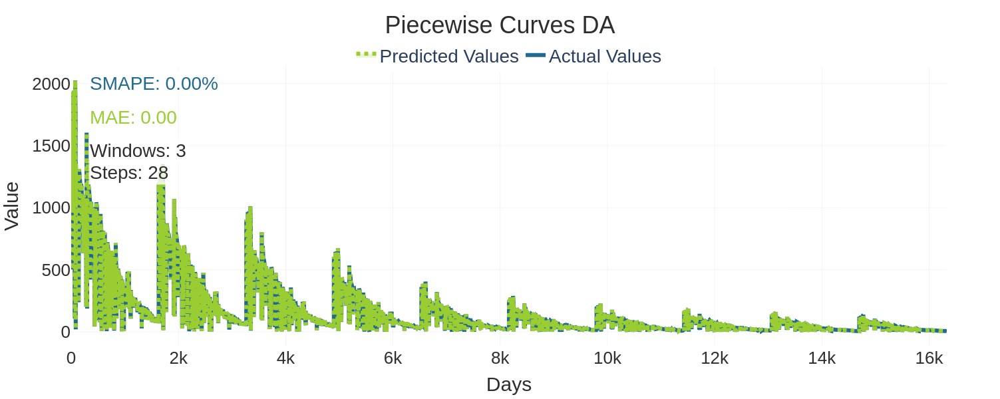

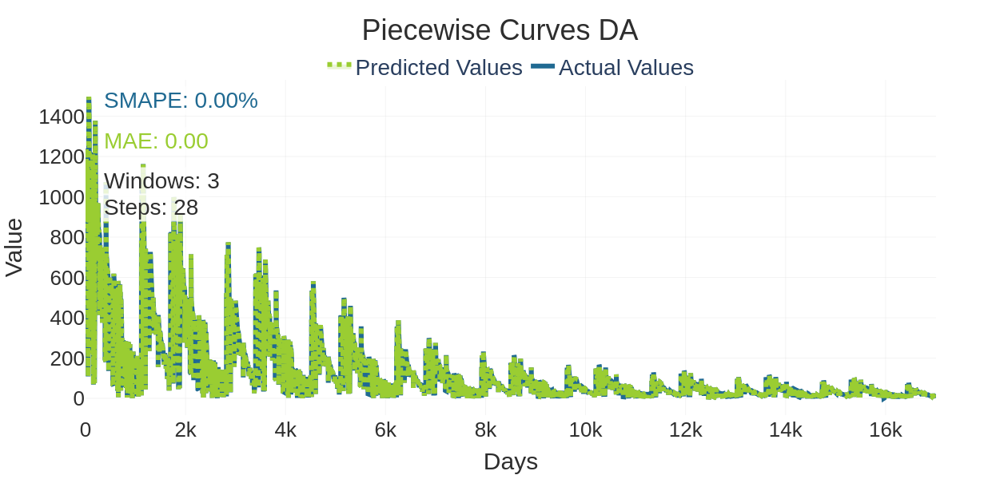

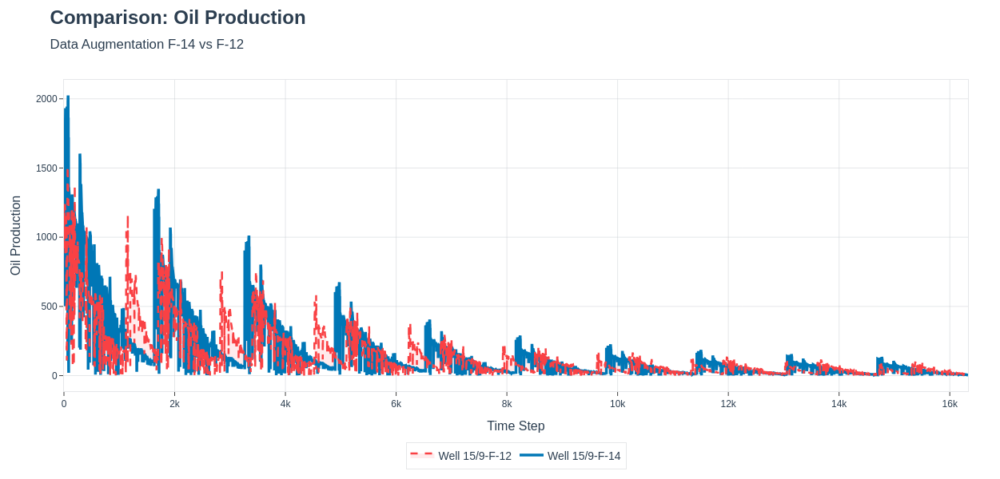

In [41]:
from src.evaluation.evaluation import plot_comparison
from src.common.config_wells import DATA_SOURCES
from src.common.batch_preprocessing import load_and_preprocess_data
from src.data.data_loading import DataSource
from src.common.common import split_time_series, augment_with_synthetic_samples

# Configurações iniciais
selected_features = ['BORE_OIL_VOL']
well_names = ['15/9-F-14', '15/9-F-12']

# Seleciona apenas os data sources relevantes
data_source = next(ds for ds in DATA_SOURCES if ds["name"] == 'VOLVE')

# Carrega e processa os dados para cada poço
well_data = {
    name: load_and_preprocess_data(DataSource, data_source, selected_features, name)
    for name in well_names
}

# Divide em treino e teste
split_data = {
    name: split_time_series(df, df, 0.6)
    for name, df in well_data.items()
}

# Aplica data augmentation aos dados de teste
augmented_test_data = {
    name: augment_with_synthetic_samples(test.to_numpy().squeeze(), test.to_numpy().squeeze())[0]
    for name, (_, test) in split_data.items()
}

# Plota a comparação
plot_comparison(
    augmented_test_data['15/9-F-14'],
    augmented_test_data['15/9-F-12'],
    'Oil Production',
    'Data Augmentation F-14 vs F-12',
    'Well 15/9-F-14',
    'Well 15/9-F-12'
)